In [1]:
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import os
from google.colab.patches import cv2_imshow

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
df_calc = pd.read_csv("/content/drive/MyDrive/dataset/data.csv")

In [4]:
(df_calc['pathology']=="B").sum()

32

In [5]:
(df_calc['pathology']=="M").sum()

52

In [6]:
(df_calc['pathology']=="N").sum()

32

In [7]:
df_calc.shape

(116, 5)

In [8]:
df_calc.head()

,patient_id,left or right breast,image view,pathology,image_path
0,P01,L,CC,B,jpeg/benign/CC_L_1.jpg
1,P02,R,CC,B,jpeg/benign/CC_R_1.jpg
2,P03,L,MLO,B,jpeg/benign/MLO_L_1.jpg
3,P04,R,MLO,B,jpeg/benign/MLO_R_1.jpg
4,P05,L,CC,M,jpeg/malignant/CC_L_1.jpg


In [9]:
df_calc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 116 entries, 0 to 115
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   patient_id            116 non-null    object
 1   left or right breast  116 non-null    object
 2   image view            116 non-null    object
 3   pathology             116 non-null    object
 4   image_path            116 non-null    object
dtypes: object(5)
memory usage: 4.7+ KB


In [10]:
df_calc.isna().sum()

patient_id              0
left or right breast    0
image view              0
pathology               0
image_path              0
dtype: int64

In [11]:
from sklearn.preprocessing import LabelEncoder
enc=LabelEncoder()
df_calc['pathology']=enc.fit_transform(df_calc['pathology'])


In [12]:
df_calc.head()

,patient_id,left or right breast,image view,pathology,image_path
0,P01,L,CC,0,jpeg/benign/CC_L_1.jpg
1,P02,R,CC,0,jpeg/benign/CC_R_1.jpg
2,P03,L,MLO,0,jpeg/benign/MLO_L_1.jpg
3,P04,R,MLO,0,jpeg/benign/MLO_R_1.jpg
4,P05,L,CC,1,jpeg/malignant/CC_L_1.jpg


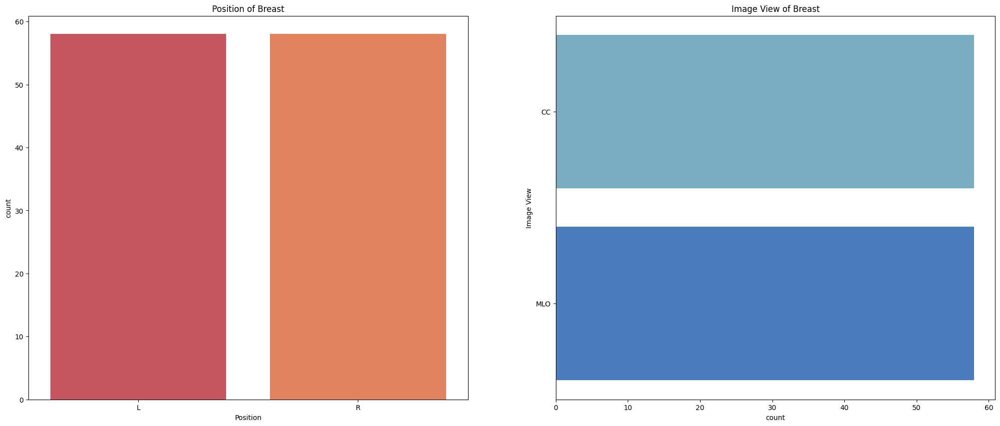

In [13]:
#Visualize the position and image view of the breast
plt.figure(figsize=(25, 10))
palette = sns.color_palette("Spectral", 8)

plt.subplot(1, 2, 1)
breat_type = df_calc['left or right breast'].value_counts()

sns.barplot(x=breat_type.index, y=breat_type.values, palette=palette)
plt.xlabel('Position')
plt.ylabel('count')
plt.title("Position of Breast")


plt.subplot(1, 2, 2)
palette = sns.color_palette("icefire", 8)

image_view = df_calc['image view'].value_counts()

sns.barplot(y=image_view.index, x=image_view.values, palette=palette)
plt.xlabel('count')
plt.ylabel('Image View')
plt.title("Image View of Breast")

plt.show()

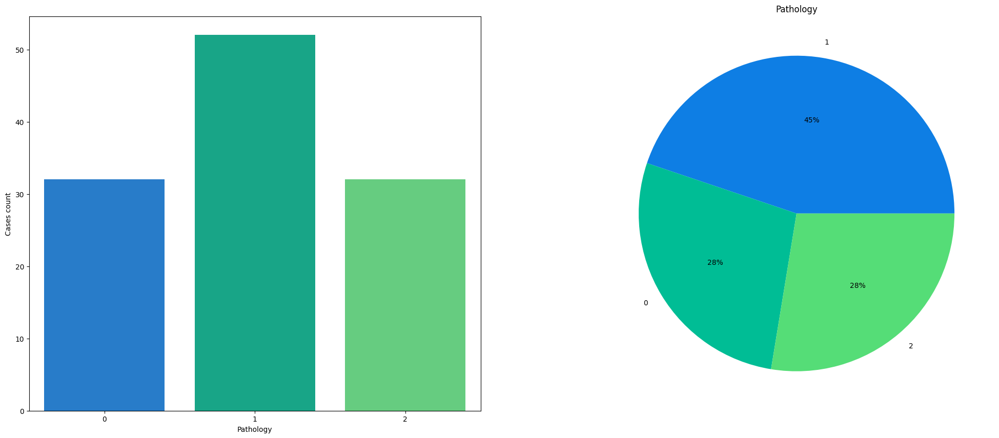

In [14]:
#Visualize Benign vs Benign without Callback vs Malignant
plt.figure(figsize=(25, 10))
palette = sns.color_palette("terrain", 8)


pathalogy_insight = df_calc["pathology"].value_counts()

plt.subplot(1, 2, 1)
sns.barplot(data=df_calc, x=pathalogy_insight.index, y=pathalogy_insight.values, palette=palette)
plt.xlabel('Pathology')
plt.ylabel('Cases count')

plt.subplot(1, 2, 2)

plt.pie(data=df_calc,  x=pathalogy_insight.values, labels=pathalogy_insight.index, autopct='%.0f%%', colors=palette)
plt.title("Pathology")


plt.show()

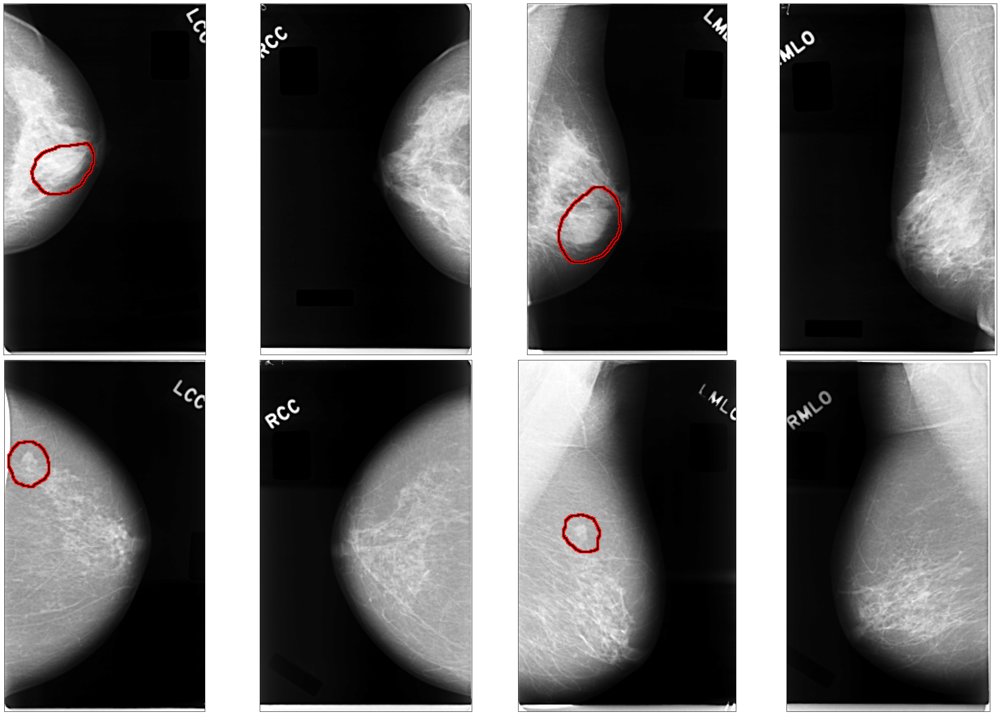

In [15]:
#visualizing mammograms
plt.figure(figsize=(30, 20)) # define the plot size


for i in range(8):
    img = plt.imread(os.path.join("/content/drive/MyDrive/dataset/jpeg//", df_calc["image_path"].iloc[i].split("/", 1)[1]))
    
    plt.subplot(2, 4, i+1) # subplot of the images 2 row and 4 columns with plt index of 0, 1, 2, 3,...
    plt.xticks([]), plt.yticks([]) # remove the axis from the plt
    # plt.xlabel("\n"+(string)(df_calc["pathology"].iloc[i]+"\n\n"), fontsize=20) # print the class label i.e Malignant or Benign
    
    plt.imshow(img, cmap='gray') # show the image
  
plt.tight_layout()
plt.show()  

In [16]:
print(df_calc.shape[0])

116


In [33]:
#sobel filter
'''from google.colab.patches import cv2_imshow
import cv2
import os

for i in range(df_calc.shape[0]):
    img = plt.imread(os.path.join("/content/drive/MyDrive/dataset/jpeg//", df_calc["image_path"].iloc[i].split("/", 1)[1]))
    # apply the Sobel filter in the x direction
    sobel_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)

        # apply the Sobel filter in the y direction
    sobel_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)

     # Compute the magnitude of Sobel gradients
    sobel = cv2.magnitude(sobel_x, sobel_y)

     # Display the original image using cv2_imshow
    cv2_imshow(img)


    # Display the Sobel-filtered image using cv2_imshow
    cv2_imshow(sobel)


       # display the original and median images side-by-side
    # Display the original and median images side-by-side
    # fig, ax = plt.subplots(ncols=2, figsize=(10, 5))
    # ax[0].imshow(img)
    # ax[0].set_title("Original")
    # ax[1].imshow(sobel, cmap='gray')
    # ax[1].set_title("sobel filtered")
    # plt.show()'''



        

'from google.colab.patches import cv2_imshow\nimport cv2\nimport os\n\nfor i in range(df_calc.shape[0]):\n    img = plt.imread(os.path.join("/content/drive/MyDrive/dataset/jpeg//", df_calc["image_path"].iloc[i].split("/", 1)[1]))\n    # apply the Sobel filter in the x direction\n    sobel_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)\n\n        # apply the Sobel filter in the y direction\n    sobel_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)\n\n     # Compute the magnitude of Sobel gradients\n    sobel = cv2.magnitude(sobel_x, sobel_y)\n\n     # Display the original image using cv2_imshow\n    cv2_imshow(img)\n\n\n    # Display the Sobel-filtered image using cv2_imshow\n    cv2_imshow(sobel)\n\n\n       # display the original and median images side-by-side\n    # Display the original and median images side-by-side\n    # fig, ax = plt.subplots(ncols=2, figsize=(10, 5))\n    # ax[0].imshow(img)\n    # ax[0].set_title("Original")\n    # ax[1].imshow(sobel, cmap=\'gray\')\n    # ax[1].s

In [ ]:
'''#median filtyer
import cv2
import numpy as np
import os
from google.colab.patches import cv2_imshow
# Set the directory containing the mammogram dataset
data_dir = '/content/drive/MyDrive/dataset/jpeg//'

# Set the output directory for the filtered images
output_dir = '/content/drive/MyDrive/dataset/jpeg/jpeg_median'

# Create the output directory if it doesn't exist
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Loop over all images in the dataset
for filename in os.listdir(data_dir):
    if filename.endswith('.jpg'):
        # Load the mammogram image
        img = cv2.imread(os.path.join(data_dir, filename), 0)

        # Apply median filter with kernel size 3x3
        filtered_img = cv2.medianBlur(img, 3)

        # Save the filtered image to the output directory
        output_filename = os.path.join(output_dir, filename)
        cv2.imwrite(output_filename, filtered_img)
    print("median")
    cv2_imshow(img)
    cv2_imshow(filtered_img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()'''


'#median filtyer\nimport cv2\nimport numpy as np\nimport os\nfrom google.colab.patches import cv2_imshow\n# Set the directory containing the mammogram dataset\ndata_dir = \'/content/drive/MyDrive/dataset/jpeg//\'\n\n# Set the output directory for the filtered images\noutput_dir = \'/content/drive/MyDrive/dataset/jpeg/jpeg_median\'\n\n# Create the output directory if it doesn\'t exist\nif not os.path.exists(output_dir):\n    os.makedirs(output_dir)\n\n# Loop over all images in the dataset\nfor filename in os.listdir(data_dir):\n    if filename.endswith(\'.jpg\'):\n        # Load the mammogram image\n        img = cv2.imread(os.path.join(data_dir, filename), 0)\n\n        # Apply median filter with kernel size 3x3\n        filtered_img = cv2.medianBlur(img, 3)\n\n        # Save the filtered image to the output directory\n        output_filename = os.path.join(output_dir, filename)\n        cv2.imwrite(output_filename, filtered_img)\n    print("median")\n    cv2_imshow(img)\n    cv2_imsho

<ipython-input-18-90cb217aae51>:24: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(ncols=2, figsize=(10, 5))


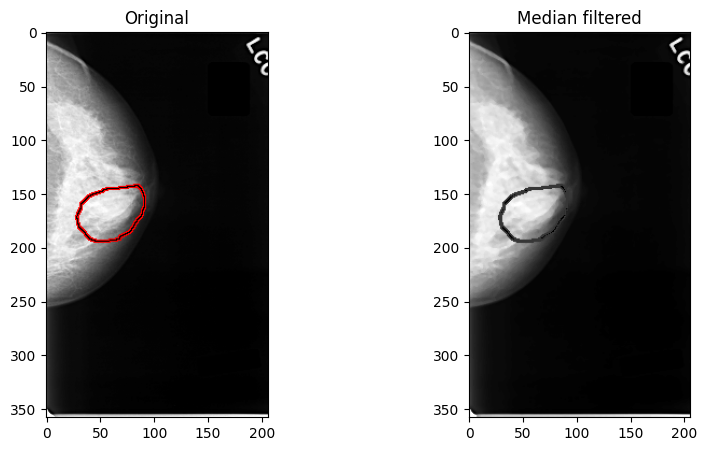

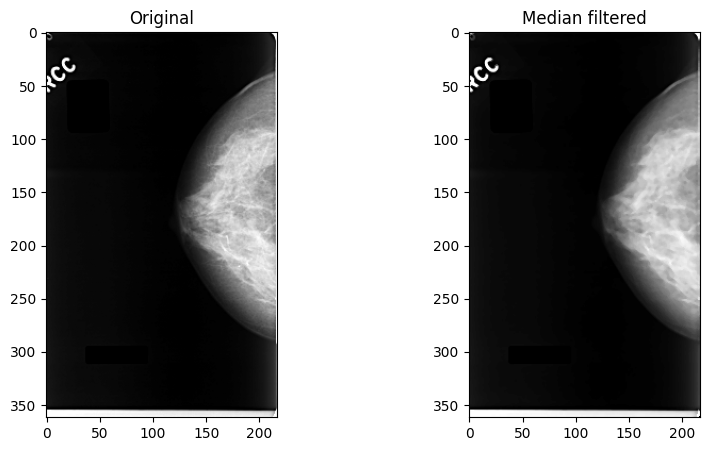

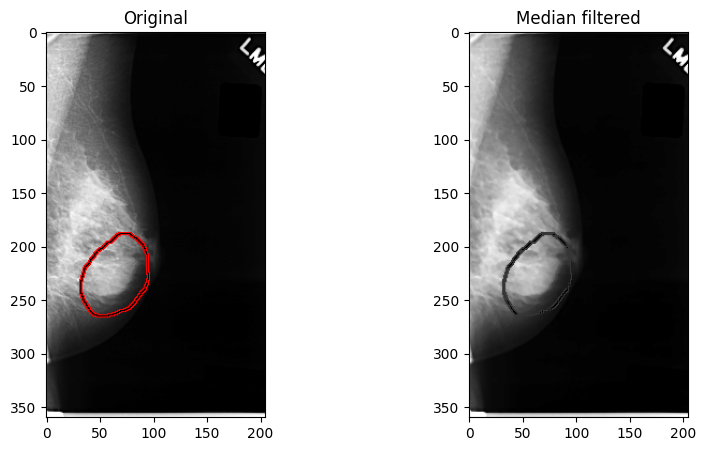

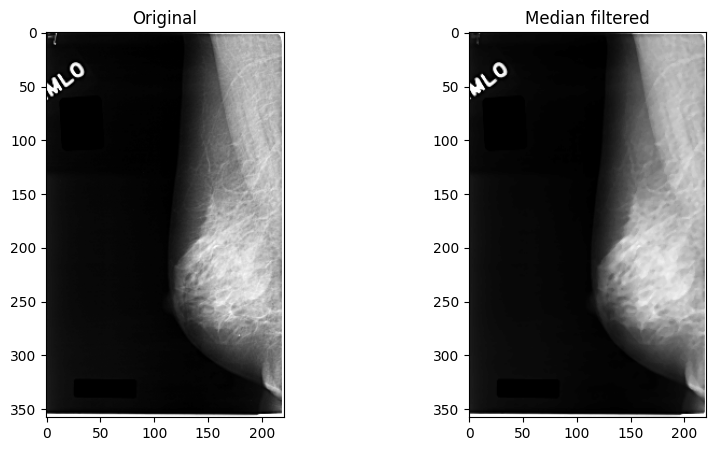

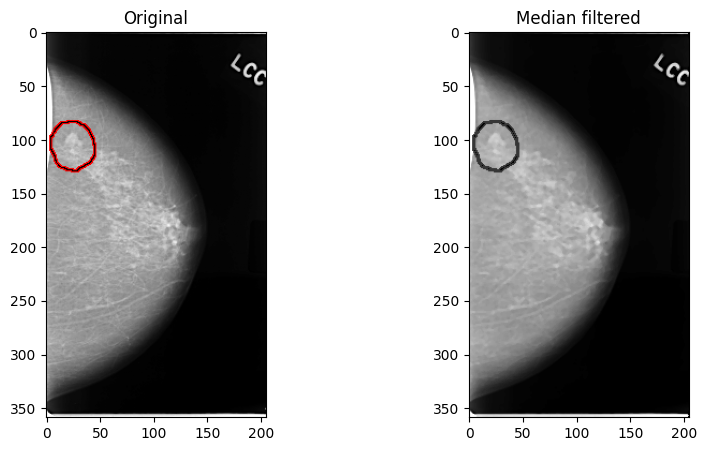

...

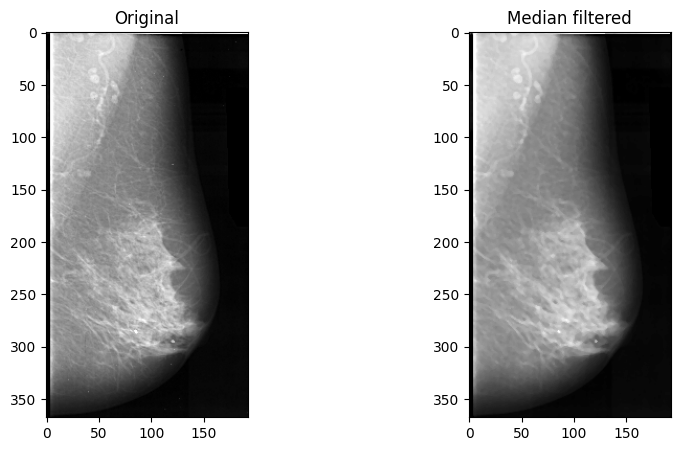

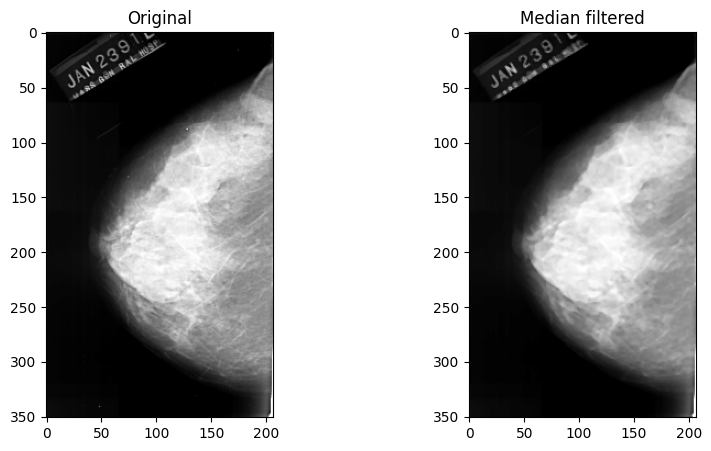

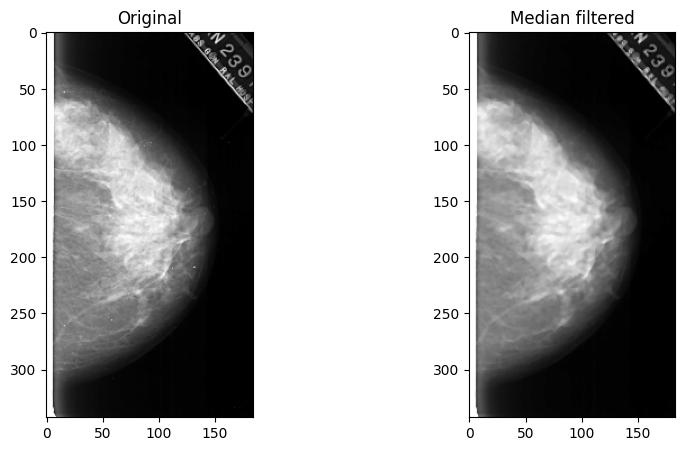

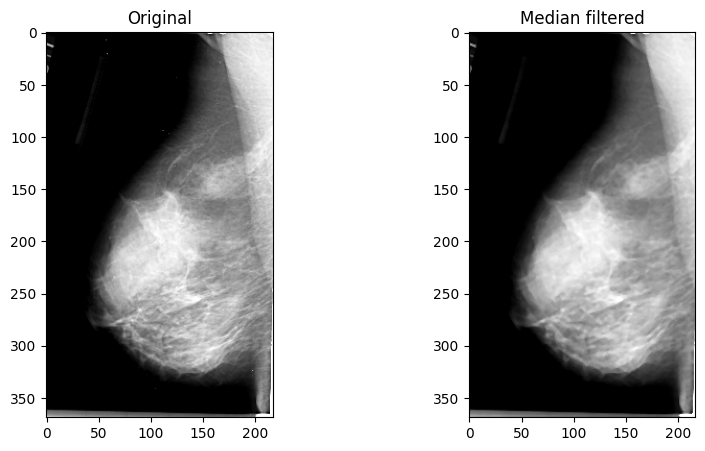

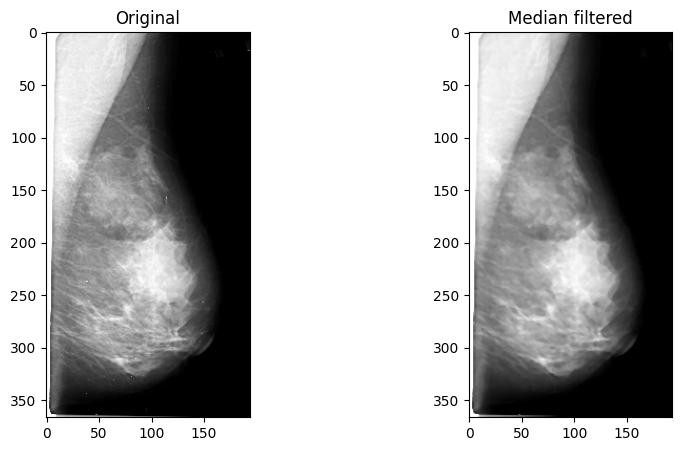

In [18]:
from scipy.signal import medfilt2d
from skimage.color import rgba2rgb, rgb2gray, gray2rgb
X1 = []
y1 = []
for i in range(df_calc.shape[0]):
    img_path = os.path.join("/content/drive/MyDrive/dataset/jpeg//", df_calc["image_path"].iloc[i].split("/", 1)[1])
    img = plt.imread(img_path)
    
    # Convert RGBA to RGB
    if img.ndim == 2:
        img = gray2rgb(img)
    elif img.shape[2] == 4:
        img = rgba2rgb(img)
    
    # Convert to grayscale
    gray_img = rgb2gray(img)

    # Apply median filter
    filtered_img = medfilt2d(gray_img, kernel_size=3)
    X1.append(filtered_img)
    y1.append(df_calc['pathology'][i])

    # Display the original and median images side-by-side
    fig, ax = plt.subplots(ncols=2, figsize=(10, 5))
    ax[0].imshow(img)
    ax[0].set_title("Original")
    ax[1].imshow(filtered_img, cmap='gray')
    ax[1].set_title("Median filtered")
plt.show()


In [19]:
# Convert the lists to numpy arrays
X1 = np.array(X1, dtype=object)
y1 = np.array(y1)
from sklearn.model_selection import train_test_split
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=0.3, random_state=42)

# Reshape the data to fit the model
X_train_filtered = np.array([cv2.resize(x, (200, 200)) for x in X_train])
X_test_filtered = np.array([cv2.resize(x, (200, 200)) for x in X_test])
X_train_filtered = X_train_filtered.reshape(X_train_filtered.shape[0], 200, 200, 1)
X_test_filtered = X_test_filtered.reshape(X_test_filtered.shape[0], 200, 200, 1)

# Normalize the pixel values to be between 0 and 1
X_train_norm = X_train_filtered / 1.0
X_test_norm = X_test_filtered / 1.0

In [20]:
# Import the necessary libraries 
import tensorflow as tf
from tensorflow import keras
from scipy.io import loadmat
from tensorflow.keras import regularizers

# Define the CNN model
model = keras.Sequential([keras.layers.Conv2D(20,(3,3),activation='relu',input_shape=(200,200,1)),
                          keras.layers.BatchNormalization(),
                          keras.layers.MaxPooling2D((2, 2)),
                          keras.layers.Conv2D(40, (3, 3), activation='relu'),
                          keras.layers.BatchNormalization(),
                          keras.layers.MaxPooling2D((3, 3)),
                          keras.layers.Conv2D(80, (3, 3), activation='relu'),
                          keras.layers.MaxPooling2D((5, 5)),
                          # keras.layers.SpatialDropout2D(0.3),
                          # keras.layers.Conv2D(120, (3, 3), activation='relu'),
                          #keras.layers.MaxPooling2D((3, 3)),
                          keras.layers.Flatten(),
                          # keras.layers.GlobalAveragePooling2D(),
                          #keras.layers.Dense(100, activation='relu',kernel_regularizer=regularizers.l2(0.001)),
                          keras.layers.Dense(80,activation='relu',kernel_regularizer=regularizers.l2(0.001)),
                          keras.layers.Dropout(0.5),

                          keras.layers.Dense(3, activation='softmax',kernel_regularizer=regularizers.l2(0.001)) 
                          ])


# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.003),  loss=tf.keras.losses.CategoricalCrossentropy(),metrics=['accuracy'])
# Print the model summary
model.summary()

# Train the model
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.1, patience=3, verbose=1, mode='min',
    min_delta=0.00001, cooldown=5, min_lr=0
)

early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=3, 
                                              patience=10, restore_best_weights=True)
batchsize=4
history=model.fit(X_train_norm,y=tf.keras.utils.to_categorical(y_train), epochs=50, batch_size=batchsize, 
          steps_per_epoch=(len(X_train_norm)/batchsize), 
          shuffle=True,validation_data=(X_test_norm,tf.keras.utils.to_categorical(y_test)),
          callbacks=[reduce_lr,early_stop]
                 )

# Evaluate the model on the test set


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 198, 198, 20)      200       
                                                                 
 batch_normalization (BatchN  (None, 198, 198, 20)     80        
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 99, 99, 20)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 97, 97, 40)        7240      
                                                                 
 batch_normalization_1 (Batc  (None, 97, 97, 40)       160       
 hNormalization)                                                 
                                                        

In [21]:
test_loss, test_acc = model.evaluate(X_test_norm, y=tf.keras.utils.to_categorical(y_test),batch_size=1)

35/35 [==============================] - 1s 18ms/step - loss: 0.7867 - accuracy: 0.8000


In [22]:
model.save("success1.h5")

In [24]:
'''import keras
from distutils.log import debug
from fileinput import filename
from flask import *
from tensorflow.keras.preprocessing.sequence import pad_sequences
m1=keras.models.load_model("success0.h5")
m1.summary()'''

'import keras\nfrom distutils.log import debug\nfrom fileinput import filename\nfrom flask import *\nfrom tensorflow.keras.preprocessing.sequence import pad_sequences\nm1=keras.models.load_model("success0.h5")\nm1.summary()'

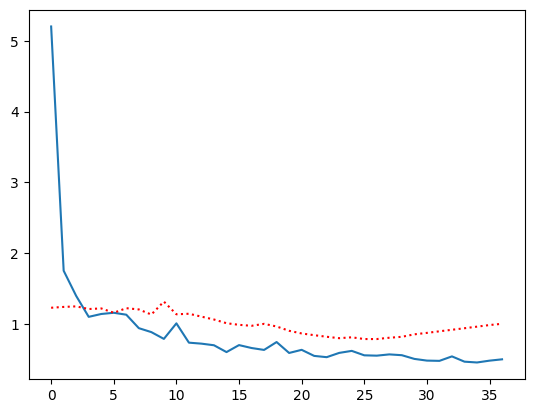

In [25]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'],":r")


In [26]:
model.predict(X_test_norm[:9])

1/1 [==============================] - 0s 463ms/step


array([[0.08523005, 0.7732819 , 0.1414881 ],
       [0.2784996 , 0.3977773 , 0.32372305],
       [0.58998924, 0.40345746, 0.00655337],
       [0.4962578 , 0.45143157, 0.0523106 ],
       [0.4215356 , 0.33974555, 0.23871887],
       [0.01923094, 0.10226694, 0.87850213],
       [0.02606007, 0.2610703 , 0.71286947],
       [0.34750494, 0.570378  , 0.08211704],
       [0.06569651, 0.6701107 , 0.26419282]], dtype=float32)

In [27]:
tf.keras.utils.to_categorical(y_test[:9])

array([[0., 1., 0.],
       [0., 1., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [0., 1., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [0., 1., 0.]], dtype=float32)

In [28]:
X_train_norm.shape

(81, 200, 200, 1)

In [29]:
y_train

array([0, 0, 1, 1, 1, 1, 2, 1, 2, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0,
       2, 2, 0, 0, 2, 0, 1, 1, 0, 0, 1, 2, 1, 2, 2, 2, 1, 0, 1, 1, 1, 1,
       2, 1, 2, 0, 0, 0, 2, 0, 1, 0, 2, 0, 1, 2, 1, 1, 2, 0, 1, 1, 0, 1,
       2, 2, 2, 1, 2, 1, 2, 1, 1, 1, 2, 1, 2, 0, 2])

In [30]:
test_loss, test_acc = model.evaluate(X_test_norm, y=tf.keras.utils.to_categorical(y_test))
print('Test accuracy:', test_acc)

2/2 [==============================] - 1s 86ms/step - loss: 0.7867 - accuracy: 0.8000
Test accuracy: 0.800000011920929


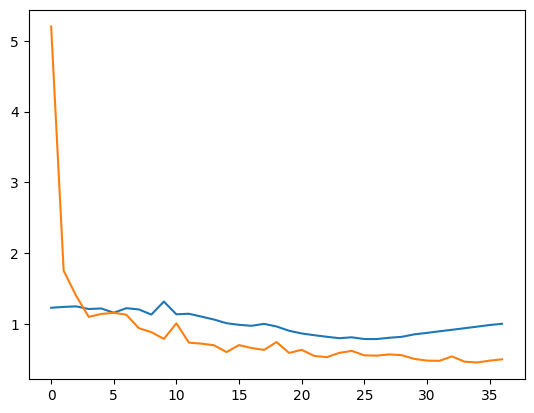

In [31]:
plt.plot(history.history['val_loss'])
plt.plot(history.history['loss'])


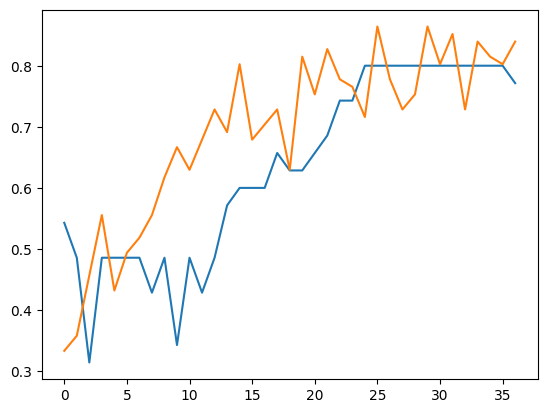

In [32]:
plt.plot(history.history['val_accuracy'])
plt.plot(history.history['accuracy'])